# This notebook is just GSK playing around
All code is shamelessly stolen from either tutorial 2, and/or https://www.kaggle.com/code/mistag/extracting-bird-song-signatures-with-wavelets

In [6]:
%pip install PyWavelets

Note: you may need to restart the kernel to use updated packages.


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import matplotlib.image as mpimg
import io
import librosa
import warnings

import pywt

warnings.filterwarnings('ignore') # get rid of librosa warnings

In [8]:
from IPython.display import Audio # for listening to our insects


In [9]:
import math

# Continous Wavelet Transform with Morlet wavelet 
# Original code by Alexander Neergaard, https://github.com/neergaard/CWT
# 
# Parameters:
#   data: input data
#   nv: # of voices (scales) per octave
#   sr: sampling frequency (Hz)
#   low_freq: lowest frequency (Hz) of interest (limts longest scale)
def cwt2(data, nv=10, sr=1., low_freq=0.):
    data -= np.mean(data)
    n_orig = data.size
    ds = 1 / nv
    dt = 1 / sr

    # Pad data symmetrically
    padvalue = n_orig // 2
    x = np.concatenate((np.flipud(data[0:padvalue]), data, np.flipud(data[-padvalue:])))
    n = x.size

    # Define scales
    _, _, wavscales = getDefaultScales(n_orig, ds, sr, low_freq)
    num_scales = wavscales.size

    # Frequency vector sampling the Fourier transform of the wavelet
    omega = np.arange(1, math.floor(n / 2) + 1, dtype=np.float64)
    omega *= (2 * np.pi) / n
    omega = np.concatenate((np.array([0]), omega, -omega[np.arange(math.floor((n - 1) / 2), 0, -1, dtype=int) - 1]))

    # Compute FFT of the (padded) time series
    f = np.fft.fft(x)

    # Loop through all the scales and compute wavelet Fourier transform
    psift, freq = waveft(omega, wavscales)

    # Inverse transform to obtain the wavelet coefficients.
    cwtcfs = np.fft.ifft(np.kron(np.ones([num_scales, 1]), f) * psift)
    cfs = cwtcfs[:, padvalue:padvalue + n_orig]
    freq = freq * sr

    return cfs, freq

def getDefaultScales(n, ds, sr, low_freq):
    nv = 1 / ds
    # Smallest useful scale (default 2 for Morlet)
    s0 = 2

    # Determine longest useful scale for wavelet
    max_scale = n // (np.sqrt(2) * s0)
    if max_scale <= 1:
        max_scale = n // 2
    max_scale = np.floor(nv * np.log2(max_scale)) 
    a0 = 2 ** ds
    scales = s0 * a0 ** np.arange(0, max_scale + 1)
    
    # filter out scales below low_freq
    fourier_factor = 6 / (2 * np.pi)
    frequencies = sr * fourier_factor / scales
    frequencies = frequencies[frequencies >= low_freq]
    scales = scales[0:len(frequencies)]

    return s0, ds, scales

def waveft(omega, scales):
    num_freq = omega.size
    num_scales = scales.size
    wft = np.zeros([num_scales, num_freq])

    gC = 6
    mul = 2
    for jj, scale in enumerate(scales):
        expnt = -(scale * omega - gC) ** 2 / 2 * (omega > 0)
        wft[jj, ] = mul * np.exp(expnt) * (omega > 0)

    fourier_factor = gC / (2 * np.pi)
    frequencies = fourier_factor / scales

    return wft, frequencies

In [95]:
import scipy.fftpack
from scipy import signal
from scipy.signal import chirp

DB_RANGE = 100 # dynamic range to show in dB
SR = 44100
CMAP = 'magma'

def show_sigx3(d):
    fig, axes = plt.subplots(1, 3, figsize=(16,5))
    # FFT
    N, T = SR, 1./SR
    x = np.linspace(0.0, int(N*T), N)
    yf = scipy.fftpack.fft(d*np.hamming(len(d)))
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    
    axes[0].plot(xf,  20*np.log10(2.0/N *np.abs(yf[:N//2])))
    axes[0].set_ylim(-80,0)
    axes[0].set_title('FFT')
    # Spectrogram
    f, t, Sxx = signal.spectrogram(d, SR)
    axes[1].pcolormesh(t, f, 20*np.log10(Sxx), shading='auto', cmap=CMAP, vmax=-60, vmin=-60-DB_RANGE)
    axes[1].set_title('Spectrogram')
    # CWT
    #cs, f = calc_cwt(d)
    cs, f = cwt2(d, nv=12, sr=SR, low_freq=40)
    axes[2].imshow(20*np.log10(np.abs(cs)), cmap=CMAP, aspect='auto', norm=None, vmax=0, vmin=-DB_RANGE)
    axes[2].set_title('Scaleogram')
    plt.show()
    
    return xf

In [145]:
def show_sigx3_pycwt(d, n_scales=145, nv=16):
    fig, axes = plt.subplots(1, 3, figsize=(16,5))
    # FFT
    N, T = SR, 1./SR
    x = np.linspace(0.0, int(N*T), N)
    yf = scipy.fftpack.fft(d*np.hamming(len(d)))
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    
    axes[0].plot(xf,  20*np.log10(2.0/N *np.abs(yf[:N//2])))
    axes[0].set_ylim(-80,0)
    axes[0].set_title('FFT')
    # Spectrogram
    f, t, Sxx = signal.spectrogram(d, SR)
    axes[1].pcolormesh(t, f, 20*np.log10(Sxx), shading='auto', cmap=CMAP, vmax=-60, vmin=-60-DB_RANGE)
    axes[1].set_title('Spectrogram')
    # CWT
    #cs, f = calc_cwt(d)
    wavelet_xf  = np.linspace(0.1, 1.0/(2.0*T), n_scales)
    pywt.frequency2scale('cmorl0.5-1.0', wavelet_xf / SR)
    cs, f = pywt.cwt(d, scales, 'cmorl0.5-1.0', sampling_period=T, method='fft')
    
    # getting seconds from the signal
    tsec = cs.shape[1] / SR
    tscale = cs.shape[0]
    axes[2].imshow(20*np.log10(np.abs(cs)), cmap=CMAP, aspect='auto', norm=None, vmax=0, vmin=-DB_RANGE, extent=[0, tsec, tscale, 0])
    axes[2].set_title('Scaleogram')
    plt.show()
    
    return xf, f

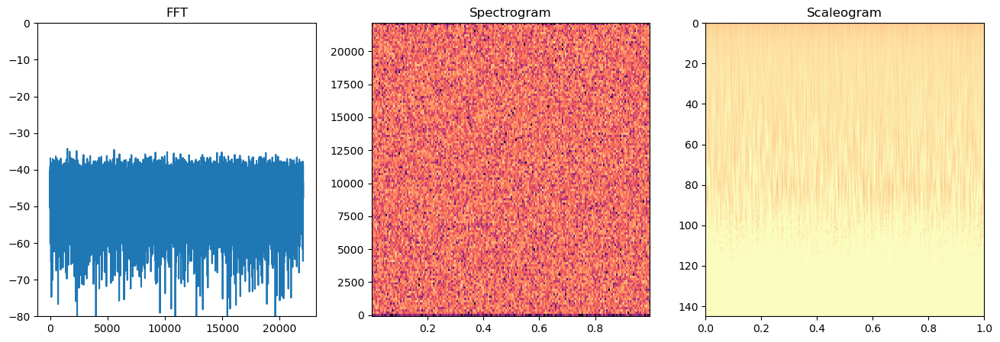

In [146]:
d = np.random.randn(SR)
freq = show_sigx3_pycwt(d)

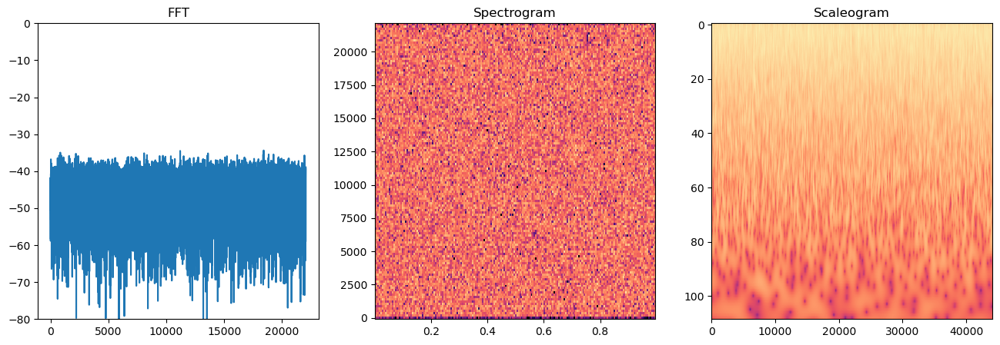

array([0.00000000e+00, 1.00004535e+00, 2.00009071e+00, ...,
       2.20479999e+04, 2.20490000e+04, 2.20500000e+04])

In [143]:
show_sigx3(d)

In [ ]:
freq = show_sigx3_pycwt(d1)

In [84]:
freq = pywt.scale2frequency('cmor1.5-1.0', scales) * SR
pywt.frequency2scale('cmor1.5-1.0', freq / SR)

array([   2.        ,    2.08854756,    2.18101547,    2.27757727,
          2.37841423,    2.48371562,    2.59367911,    2.70851109,
          2.82842712,    2.95365229,    3.08442165,    3.22098066,
          3.36358566,    3.51250432,    3.66801617,    3.83041312,
          4.        ,    4.17709513,    4.36203093,    4.55515454,
          4.75682846,    4.96743125,    5.18735822,    5.41702219,
          5.65685425,    5.90730458,    6.1688433 ,    6.44196133,
          6.72717132,    7.02500864,    7.33603235,    7.66082625,
          8.        ,    8.35419026,    8.72406186,    9.11030908,
          9.51365692,    9.9348625 ,   10.37471644,   10.83404438,
         11.3137085 ,   11.81460917,   12.3376866 ,   12.88392266,
         13.45434264,   14.05001728,   14.67206469,   15.32165249,
         16.        ,   16.70838052,   17.44812372,   18.22061816,
         19.02731384,   19.86972499,   20.74943287,   21.66808875,
         22.627417  ,   23.62921834,   24.67537321,   25.76784

In [114]:
_, _, scales = getDefaultScales(d.size, ds=1/16, sr=SR, low_freq=40)
#cs, f = pywt.cwt(d1, scales, 'cmor1.5-1.0', sampling_period=1/SR)

In [115]:
len(scales)

145

In [71]:
cs.shape[1] / SR

5.0

In [45]:
example_path = '../../data/train/Chorthippusbiguttulus_XC751834-dat031-007_edit3.wav'

In [46]:
Audio(example_path)

In [47]:
from IPython.display import Audio
from sklearn.preprocessing import minmax_scale

#TRAIN_DIR = '../input/birdsong-recognition/train_audio'


def rd_file(fname, offset=0, duration=60, _sr = SR):
    data, _ = librosa.load(fname, sr=_sr, mono=True, offset=offset, duration=duration)
    data = minmax_scale(data-data.mean(), feature_range=(-1,1))
    return data

In [48]:
d1 = rd_file(example_path, duration=5) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
Audio(d1, rate=SR)

In [12]:
len(d1) #793800

220500

In [37]:
d1 = rd_file(example_path, duration=60, _sr = 10000) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
Audio(d1, rate=SR)

NameError: name 'example_path' is not defined

In [43]:
len(d1)

220500

In [44]:
dt = 1 / SR
scales = pywt.frequency2scale('cmor1.5-1.0', np.arange(1, 22050.01, 0.1)) / dt

In [33]:
frequencies = pywt.scale2frequency('cmor1.5-1.0', scales) / dt

In [ ]:
pywt.cwt(d1, scales, 'cmor1.5-1.0')

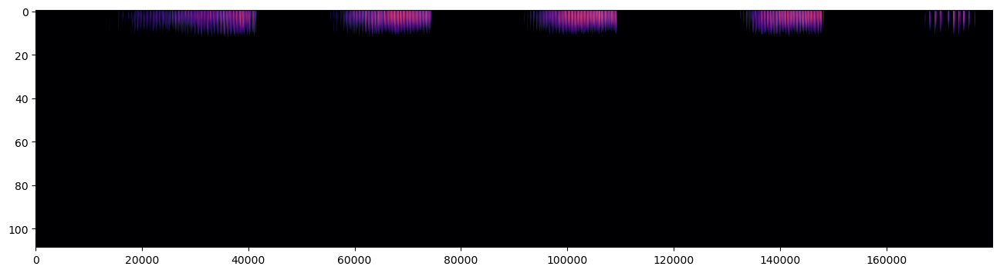

In [15]:
cs1, f1 = cwt2(d1, nv=12, sr=SR, low_freq=40)
plt.figure(figsize = (16,4))
plt.imshow(20*np.log10(np.abs(cs1)), cmap=CMAP, aspect='auto', norm=None, vmax=0, vmin=-30)
plt.show()

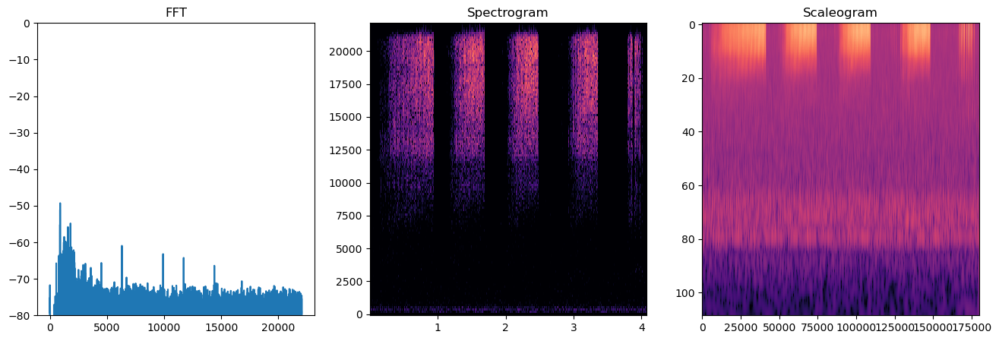

In [16]:
show_sigx3(d1)

In [17]:
# Hmm... Kernel keeps dying when running this cell... Should figure out why

In [18]:
df = pd.read_csv('../../data/metadata.csv')

paths = list(df[df['label']==50].sample(4)['path'])


In [19]:
paths

['data/train/Platypleurasp13_MHV%201487%20P.sp%2013%20nr%20Thornhill%20%232_edit2.wav',
 'data/train/Platypleurasp13_MHV%201490%20P.sp%2013%20Gamtoos%20Pass%20%231_edit1.wav',
 'data/train/Platypleurasp13_MHV%201487%20P.sp%2013%20nr%20Thornhill%20%235_edit1.wav',
 'data/val/Platypleurasp13_MHV%201487%20P.sp%2013%20nr%20Thornhill%20%234_edit1.wav']

In [20]:
Audio("../../" + paths[0])

In [21]:

Audio("../../" + paths[1])

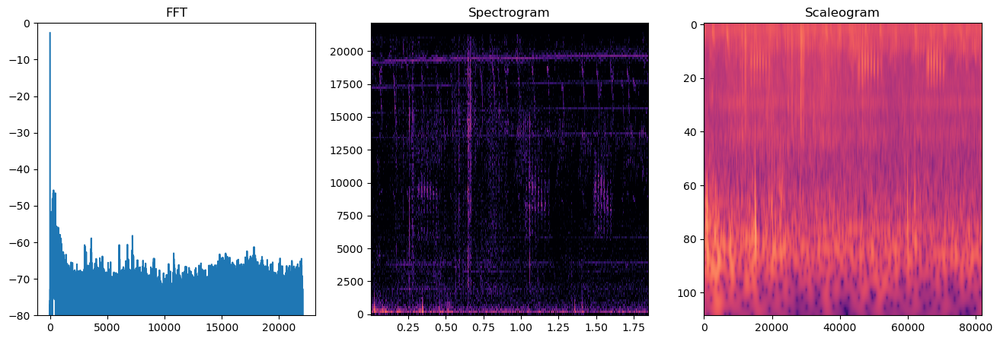

In [22]:
d = rd_file("../../" + paths[0], duration=10, _sr = 10000) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
show_sigx3(d)

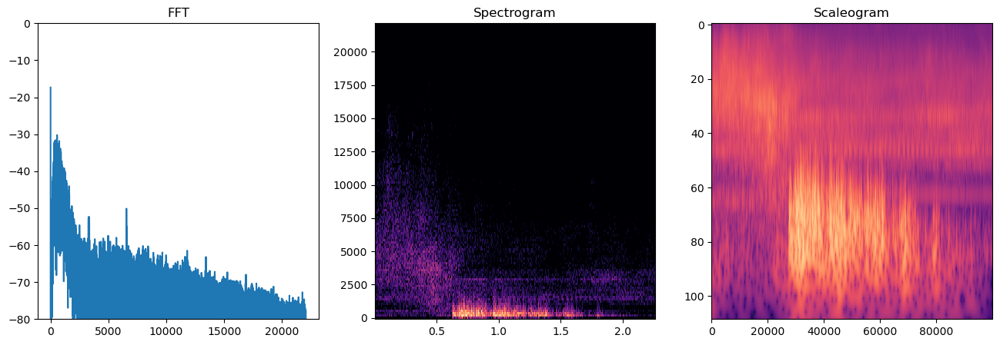

In [23]:
d = rd_file("../../" + paths[1], duration=10, _sr = 10000) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
show_sigx3(d)

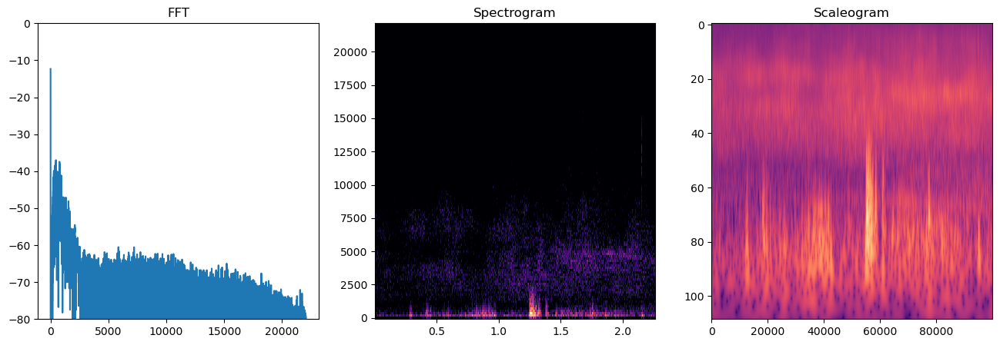

In [24]:
d = rd_file("../../" + paths[2], duration=10, _sr = 10000) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
show_sigx3(d)

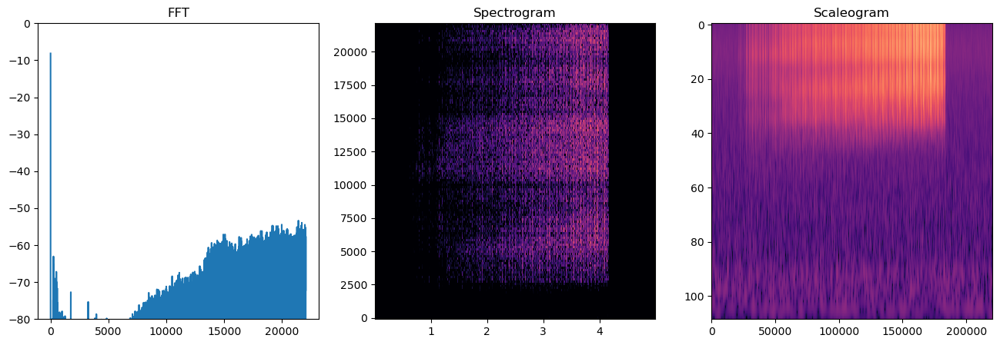

In [29]:
d = rd_file(example_path, duration=5, _sr = 44100) # 5 sec works without breaking - I think it is a memory limit. #10 sec crashes
show_sigx3(d)

In [36]:
from typing import List, Optional, Tuple
import torchaudio

def plot_waveform(path: str, time: Optional[float] = None) -> None:
    """
    Loads and plots the waveform from an audio file.

    Args:
        path (str): The path of the audio file.
        time (float, optional): The length of the audio (in seconds) to plot.
                               If provided, only the specified duration of the audio will be plotted.
                               If None, the entire audio waveform will be plotted. Default is None.

    Returns:
        None
    """
    waveform, sample_rate = torchaudio.load(path)
    if time is not None:
        num_frames = math.ceil(time * sample_rate)
        waveform = waveform[:, :num_frames]
    
    num_channels, num_frames = waveform.shape
    time_axis = np.arange(0, num_frames) / sample_rate

    plt.figure(figsize=(20, 6))
    plt.plot(time_axis, waveform[0], linewidth=1)
    plt.grid(True)
    plt.title("Waveform")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.show()

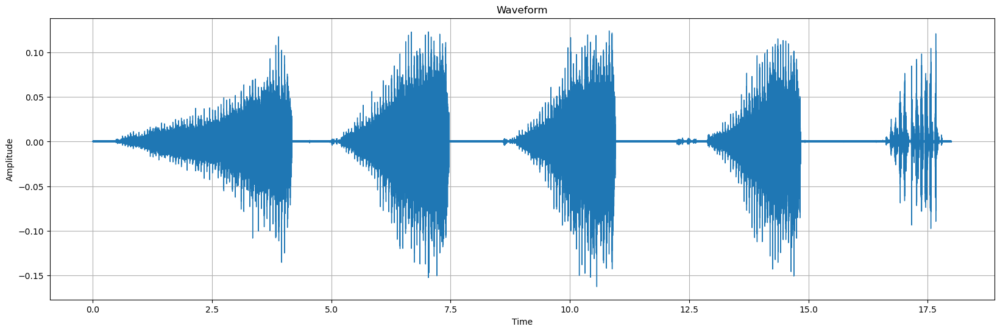

In [37]:
plot_waveform(example_path)

In [27]:
Audio(d1)

ValueError: rate must be specified when data is a numpy array or list of audio samples.